In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import kagglehub

C:\Users\hinri\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path = kagglehub.dataset_download("florianhinrichsen/nyc-taxi-data-2023-24")

PUs_df = pd.read_parquet(f"{path}\hourlyPUs2023-24WEATHER.parquet")
DOs_df = pd.read_parquet(f"{path}\hourlyDOs2023-24WEATHER.parquet")

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.size"] = 20
plt.rcParams["figure.dpi"] = 50

Trip distance vs. trip count

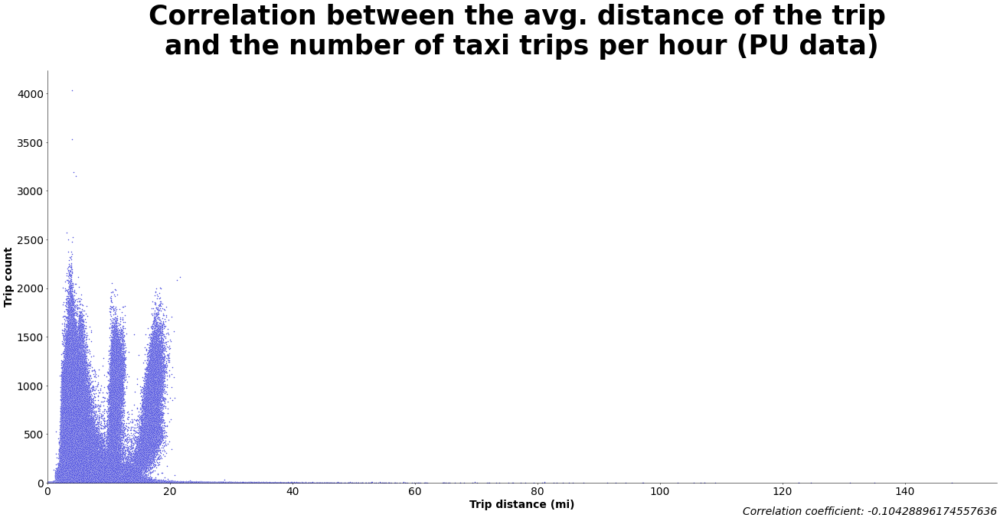

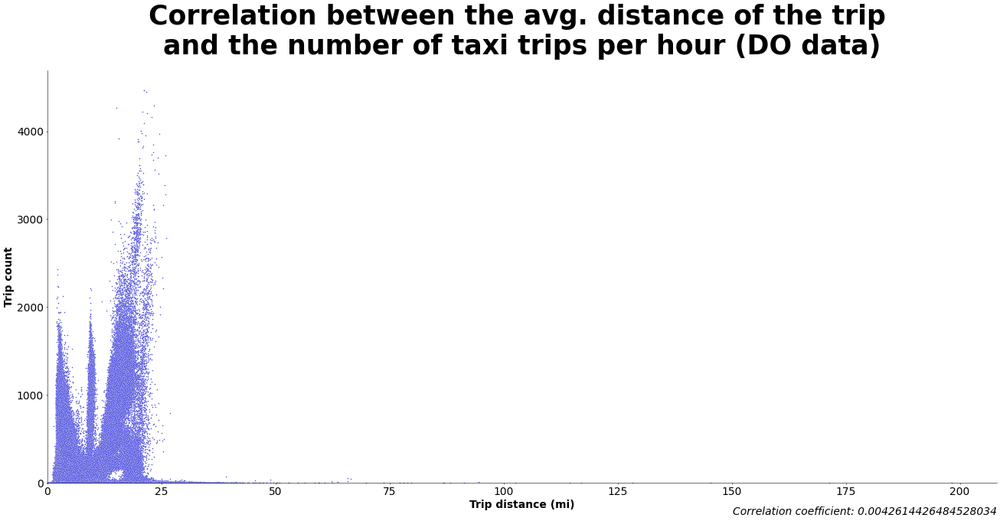

In [3]:
plt.figure(figsize=(32,14))

ax = sns.scatterplot(
    data=PUs_df,
    x="trip_distance",
    y="trip_count",
    color="#4C4EE0",
    s=5
)

plt.title("Correlation between the avg. distance of the trip \nand the number of taxi trips per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["trip_count"].corr(PUs_df["trip_distance"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSTripDistance\PUsTCvsTD.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

ax = sns.scatterplot(
    data= DOs_df,
    x="trip_distance",
    y="trip_count",
    color="#4C4EE0",
    s=5
)

plt.title("Correlation between the avg. distance of the trip \nand the number of taxi trips per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["trip_count"].corr(DOs_df["trip_distance"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSTripDistance\DOsTCvsTD.png",dpi=300)
plt.show()

Same plot but with clear outliers removed

In [4]:
print((stats.zscore(DOs_df["trip_distance"]) > 5).sum())
print((stats.zscore(PUs_df["trip_distance"]) > 5).sum())

37893
26811


In [4]:
PUs_df = pd.read_parquet(f"{path}\hourlyPUs2023-24WEATHER.parquet")
DOs_df = pd.read_parquet(f"{path}\hourlyDOs2023-24WEATHER.parquet")

2566
2598


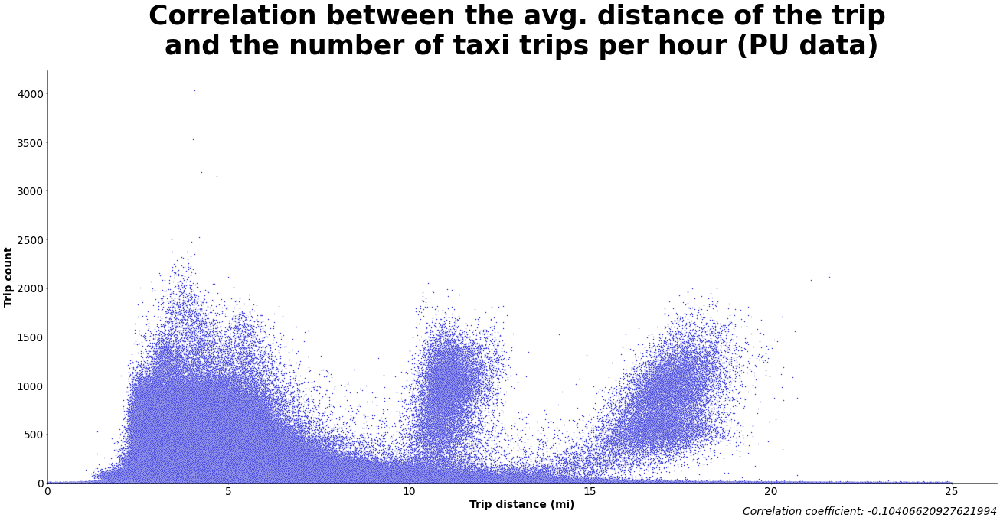

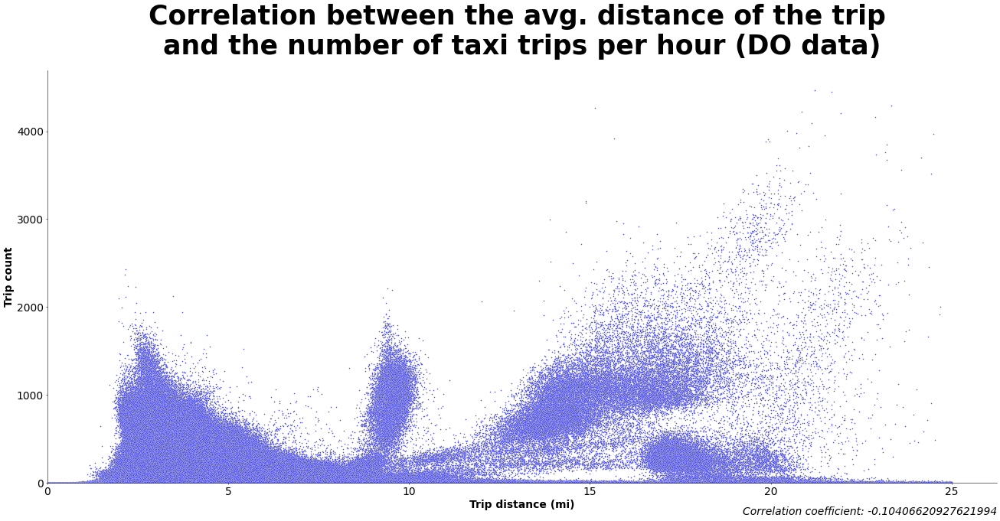

In [5]:
print((PUs_df["trip_distance"] > 25).sum())
print((DOs_df["trip_distance"] > 25).sum())


#PUs_df = PUs_df[(stats.zscore(PUs_df["trip_distance"]) < 5) & (stats.zscore(PUs_df["trip_distance"]) > -5)]
PUs_df = PUs_df[(PUs_df["trip_distance"] < 25)]
DOs_df = DOs_df[(DOs_df["trip_distance"] < 25)]

plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="trip_distance",
    y="trip_count",
    color="#4C4EE0",
    s=5
)

plt.title("Correlation between the avg. distance of the trip \nand the number of taxi trips per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["trip_count"].corr(PUs_df["trip_distance"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSTripDistance\PUsTCvsTDclean.png",dpi=300)
plt.show()



plt.figure(figsize=(32,14))

sns.scatterplot(
    data= DOs_df,
    x="trip_distance",
    y="trip_count",
    color="#4C4EE0",
    s=5
)

plt.title("Correlation between the avg. distance of the trip \nand the number of taxi trips per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["trip_count"].corr(PUs_df["trip_distance"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSTripDistance\DOsTCvsTDclean.png",dpi=300)
plt.show()

Same data but plotted as a histogram

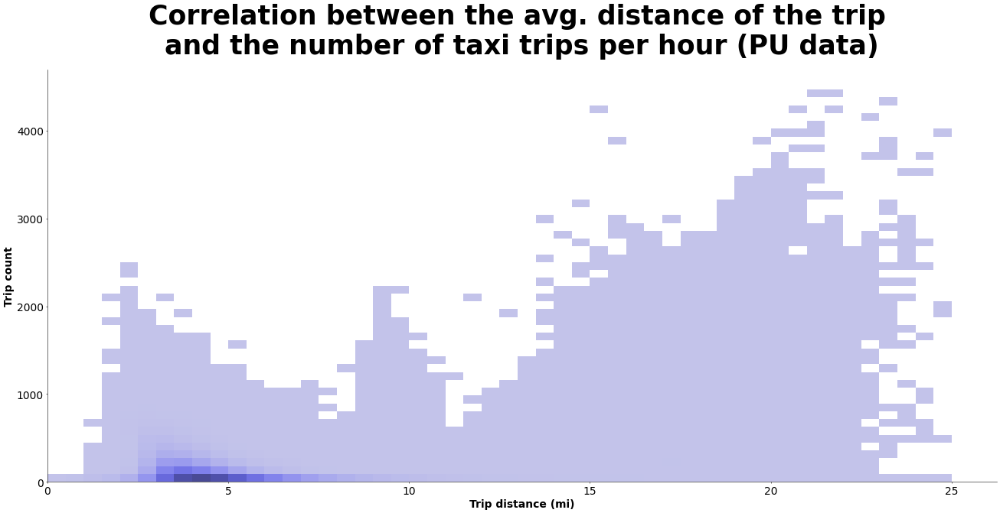

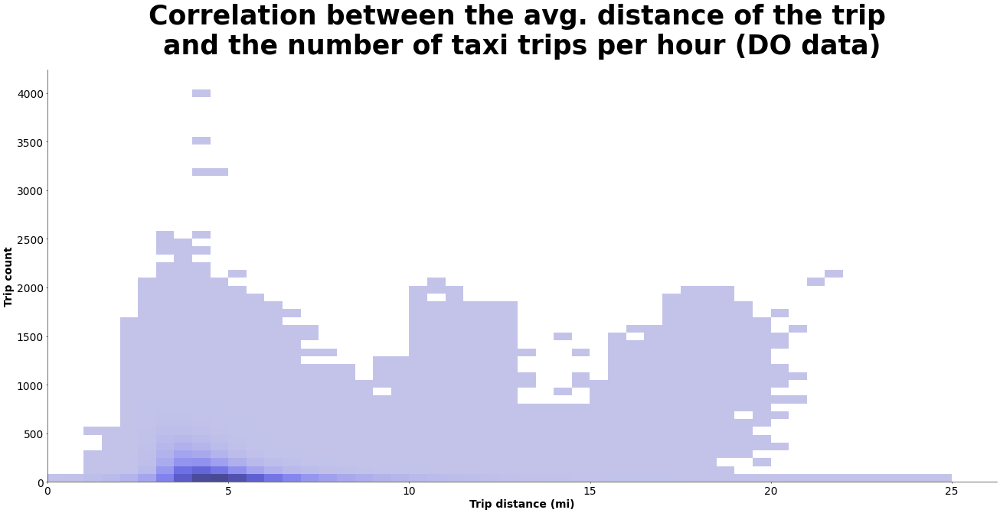

In [6]:
plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="trip_distance",
    y="trip_count",
    color="#4C4EE0",
    bins=50
)

plt.title("Correlation between the avg. distance of the trip \nand the number of taxi trips per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()


plt.savefig("Plots\Correlations\TripCountVSTripDistance\DOsTCvsTDhist.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= PUs_df,
    x="trip_distance",
    y="trip_count",
    color="#4C4EE0",
    bins=50
)

plt.title("Correlation between the avg. distance of the trip \nand the number of taxi trips per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()


plt.savefig("Plots\Correlations\TripCountVSTripDistance\PUsTCvsTDhist.png",dpi=300)
plt.show()

Trip count vs. time between vehicle request and pickup/ between pickup and dropoff

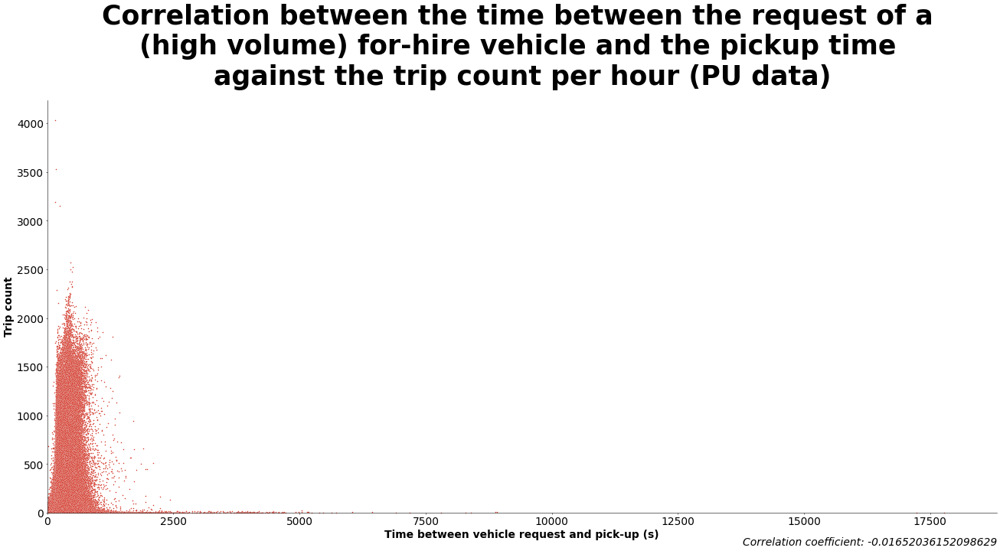

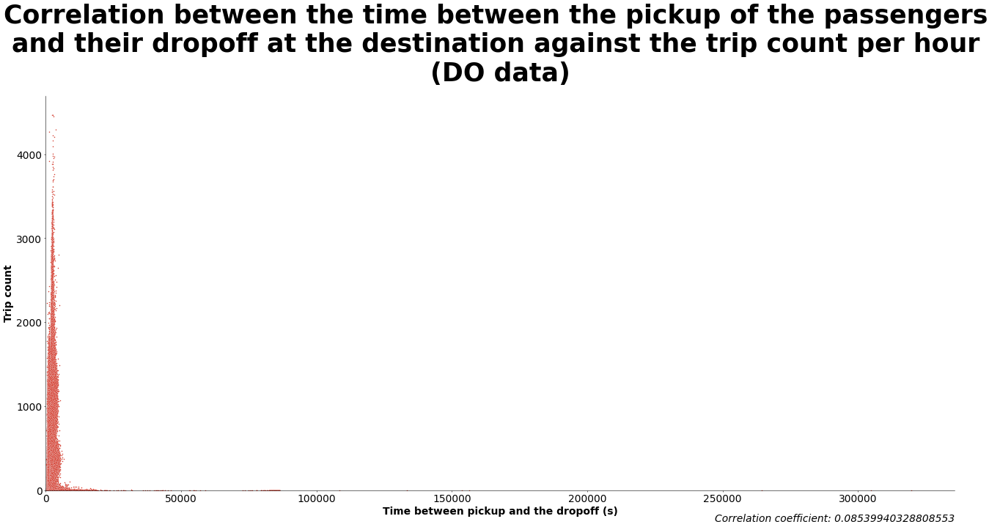

In [7]:
plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="request2PU",
    y="trip_count",
    color="#D53C2E",
    s=5
)

plt.title("Correlation between the time between the request of a \n(high volume) for-hire vehicle and the pickup time " \
"\nagainst the trip count per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Time between vehicle request and pick-up (s)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["trip_count"].corr(PUs_df["request2PU"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\RQ2PU2DO\PUsTCvsrq2PU.png",dpi=300)
plt.show()


DOs_df = DOs_df[(DOs_df["pickup2dropoff"] > 0 )]

plt.figure(figsize=(32,14))

sns.scatterplot(
    data= DOs_df,
    x="pickup2dropoff",
    y="trip_count",
    color="#D53C2E",
    s=5
)

plt.title("Correlation between the time between the pickup of the passengers \nand their dropoff at the destination" \
" against the trip count per hour \n(DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Time between pickup and the dropoff (s)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["trip_count"].corr(DOs_df["pickup2dropoff"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\RQ2PU2DO\DOsTCvsPU2DO.png",dpi=300)
plt.show()


Same data but with clear outliers removed and also plotted as a histogram

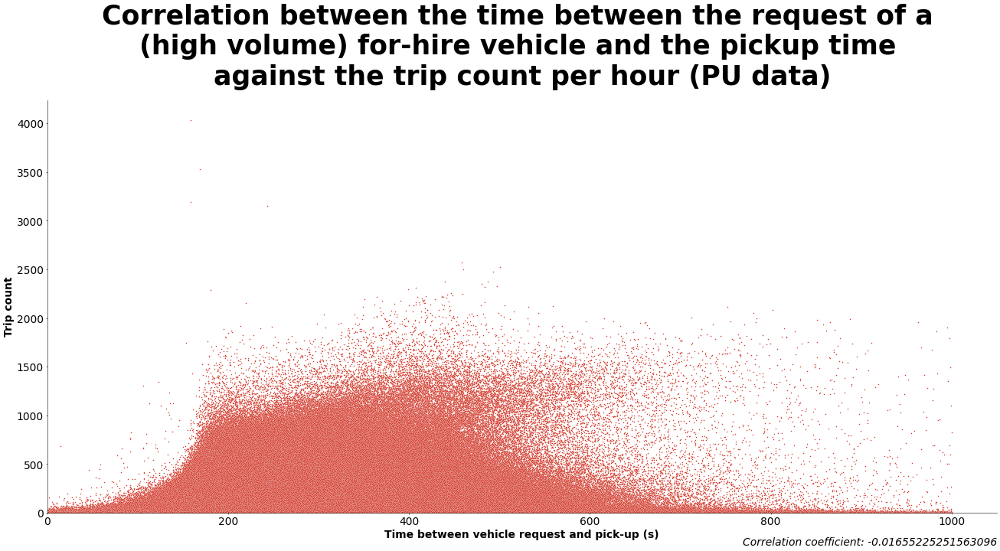

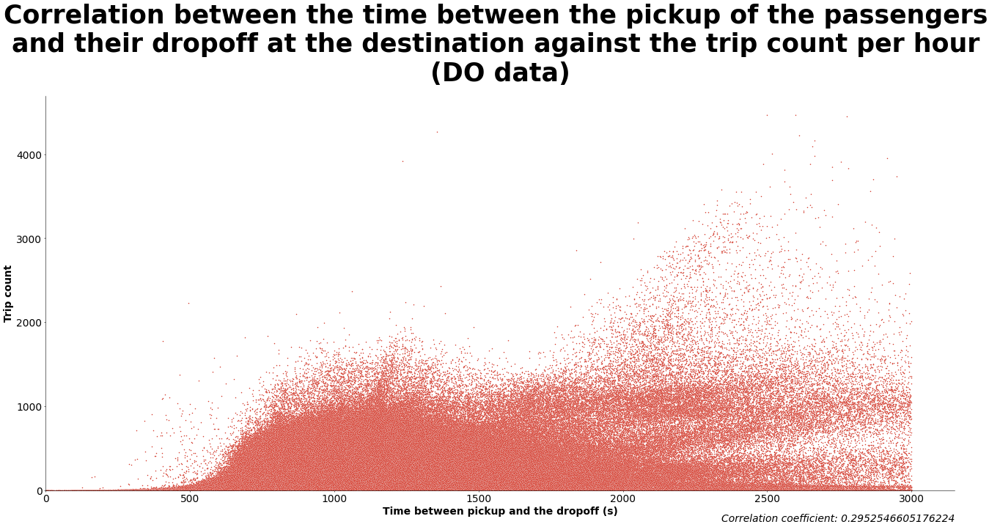

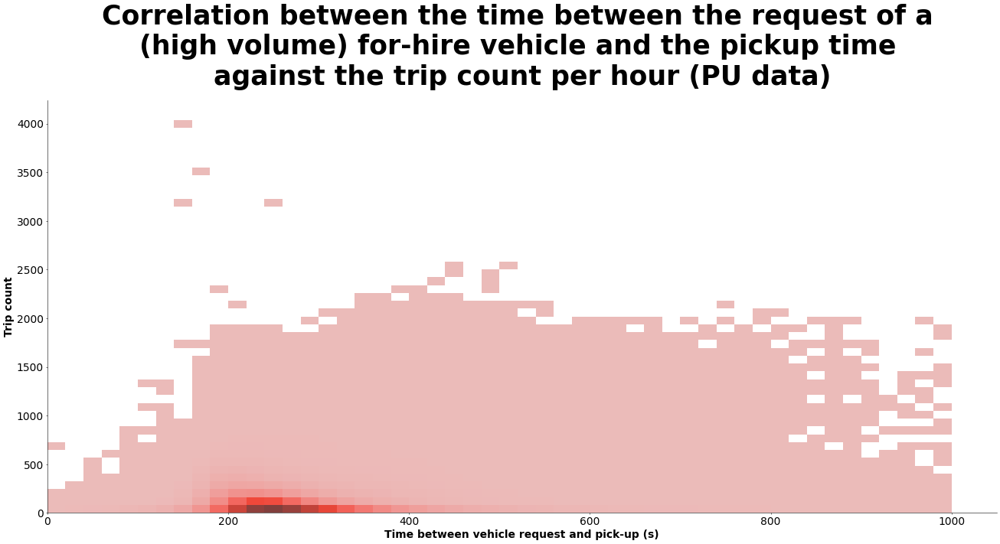

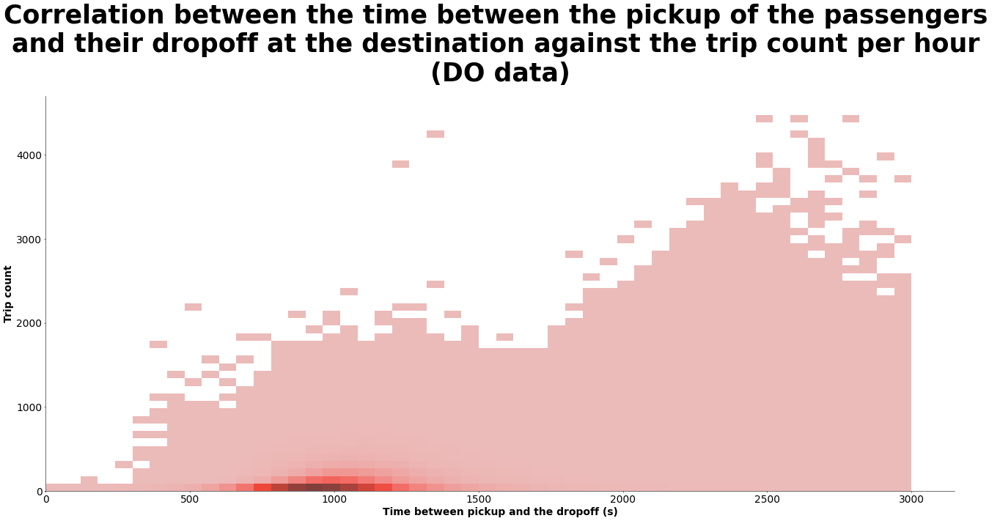

In [8]:

PUs_df = PUs_df[(PUs_df["request2PU"] < 1000) & (PUs_df["request2PU"] > 0 )]

DOs_df = DOs_df[(DOs_df["pickup2dropoff"] < 3000)]

plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="request2PU",
    y="trip_count",
    color="#D53C2E",
    s=5
)

plt.title("Correlation between the time between the request of a \n(high volume) for-hire vehicle and the pickup time " \
"\nagainst the trip count per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Time between vehicle request and pick-up (s)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["trip_count"].corr(PUs_df["request2PU"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\RQ2PU2DO\PUsTCvsrq2PUclean.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="pickup2dropoff",
    y="trip_count",
    color="#D53C2E",
    s=5
)

plt.title("Correlation between the time between the pickup of the passengers \nand their dropoff at the destination" \
" against the trip count per hour \n(DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Time between pickup and the dropoff (s)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["trip_count"].corr(DOs_df["pickup2dropoff"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\RQ2PU2DO\DOsTCvsPU2DOclean.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= PUs_df,
    x="request2PU",
    y="trip_count",
    color="#D53C2E",
    bins=50
)

plt.title("Correlation between the time between the request of a \n(high volume) for-hire vehicle and the pickup time " \
"\nagainst the trip count per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Time between vehicle request and pick-up (s)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\RQ2PU2DO\PUsTCvsrq2PUhist.png",dpi=300)
plt.show()



plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="pickup2dropoff",
    y="trip_count",
    color="#D53C2E",
    bins=50
)

plt.title("Correlation between the time between the pickup of the passengers \nand their dropoff at the destination" \
" against the trip count per hour \n(DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Time between pickup and the dropoff (s)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\RQ2PU2DO\DOsTCvsPU2DOhist.png",dpi=300)
plt.show()

Trip count vs. the time between pickup and dropoff divided by the distance of the trip (a way to measure delays caused by congestion or other factors)

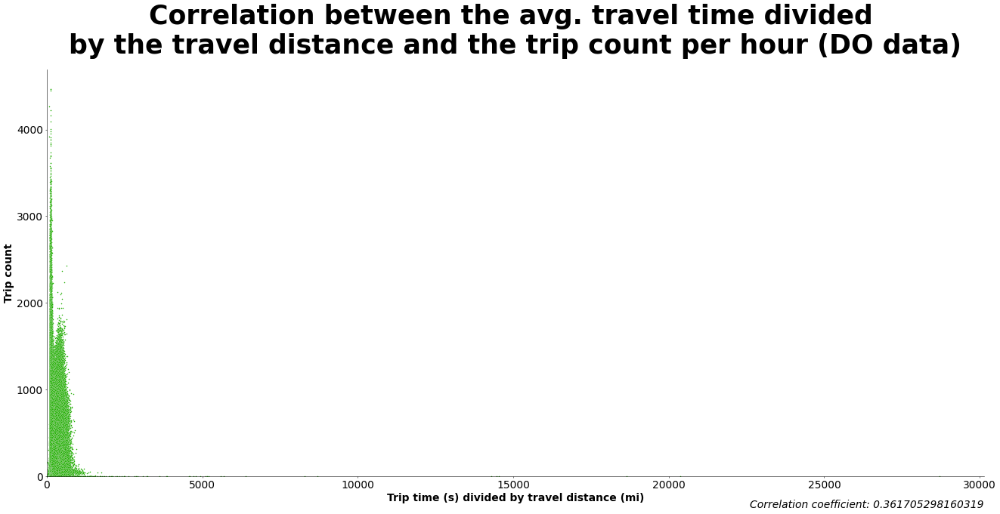

In [9]:
DOs_df["congestion_index"] = (DOs_df["pickup2dropoff"] / DOs_df["trip_distance"])

plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="congestion_index",
    y="trip_count",
    color="#22AE03",
    s=5
)

plt.title("Correlation between the avg. travel time divided \nby the travel distance and the trip count per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip time (s) divided by travel distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

corr_coeff = DOs_df["trip_count"].corr(DOs_df["congestion_index"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

sns.despine()

plt.savefig("Plots\Correlations\RQ2PU2DO\DOsCNGTNvsPU2DO.png",dpi=300)
plt.show()


Same data but with clear outliers removed

19816


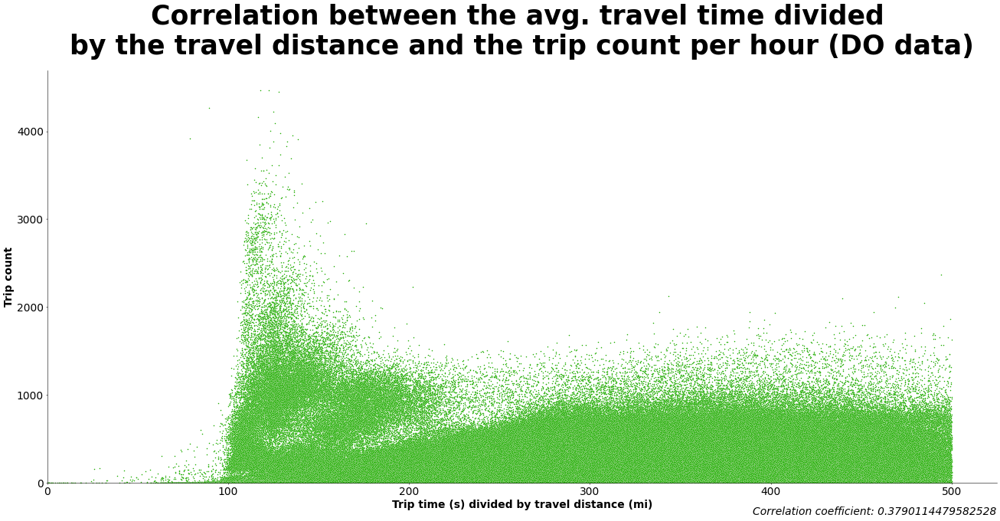

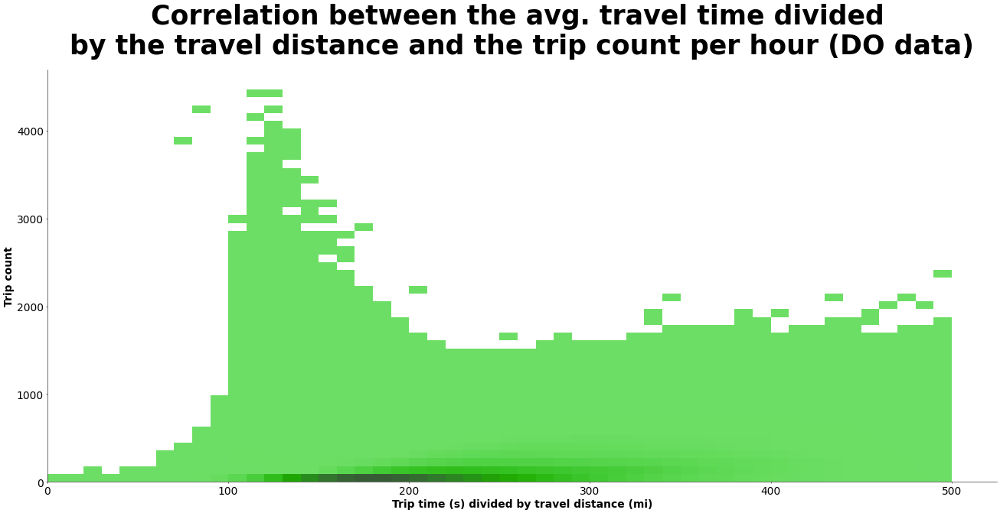

In [10]:
print((DOs_df["congestion_index"] > 500).sum())

DOs_df = DOs_df[(DOs_df["congestion_index"] < 500)]

plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="congestion_index",
    y="trip_count",
    color="#22AE03",
    s=5
)

plt.title("Correlation between the avg. travel time divided \nby the travel distance and the trip count per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip time (s) divided by travel distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["trip_count"].corr(DOs_df["congestion_index"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\RQ2PU2DO\DOsCNGTNvsPU2DOclean.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="congestion_index",
    y="trip_count",
    color="#22AE03",
    bins=50
)

plt.title("Correlation between the avg. travel time divided \nby the travel distance and the trip count per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Trip time (s) divided by travel distance (mi)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\RQ2PU2DO\DOsCNGTNvsPU2DOhist.png",dpi=300)
plt.show()


Trip count against the percentage of for hire vehicles (uber, lyft, etc.)

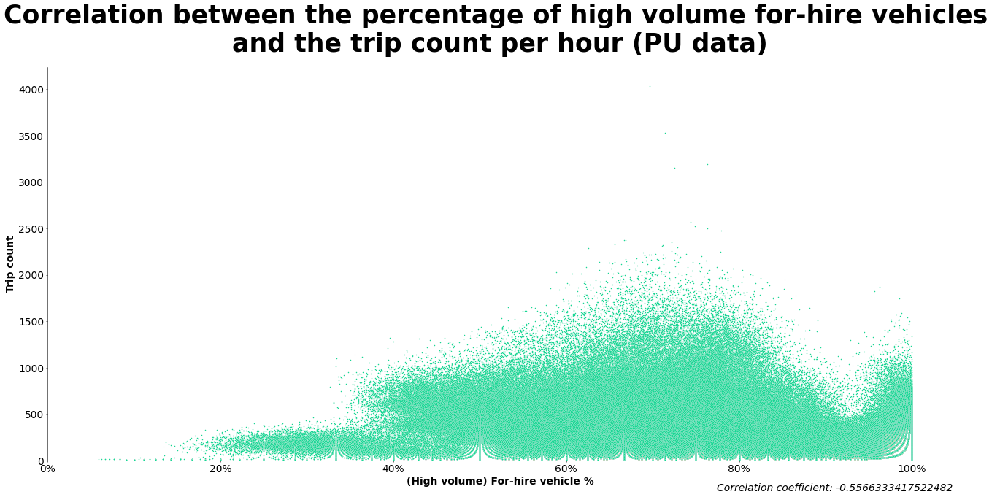

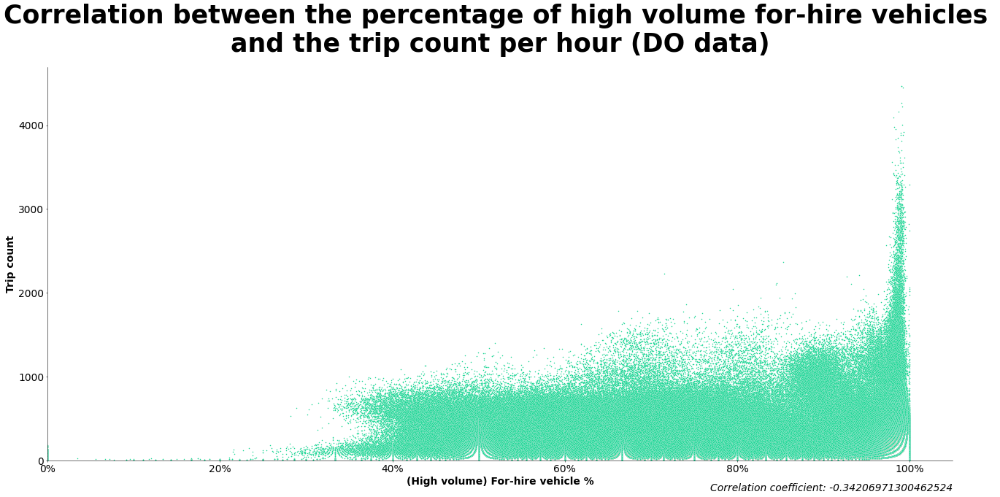

In [11]:
plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="fhvhv_percentage",
    y="trip_count",
    color="#19D694",
    s=5
)

plt.title("Correlation between the percentage of high volume for-hire vehicles \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("(High volume) For-hire vehicle %", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

plt.xticks(ticks=[0.0,0.2,0.4,0.6,0.8,1.0], labels=["0%","20%","40%","60%","80%","100%"])

sns.despine()

corr_coeff = PUs_df["trip_count"].corr(PUs_df["fhvhv_percentage"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSfhvhv%\PUsVSfhvhv%.png",dpi=300)
plt.show()

plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="fhvhv_percentage",
    y="trip_count",
    color="#19D694",
    s=5
)

plt.title("Correlation between the percentage of high volume for-hire vehicles \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("(High volume) For-hire vehicle %", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

plt.xticks(ticks=[0.0,0.2,0.4,0.6,0.8,1.0], labels=["0%","20%","40%","60%","80%","100%"])

sns.despine()

corr_coeff = DOs_df["trip_count"].corr(DOs_df["fhvhv_percentage"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSfhvhv%\DOsVSfhvhv%.png",dpi=300)
plt.show()

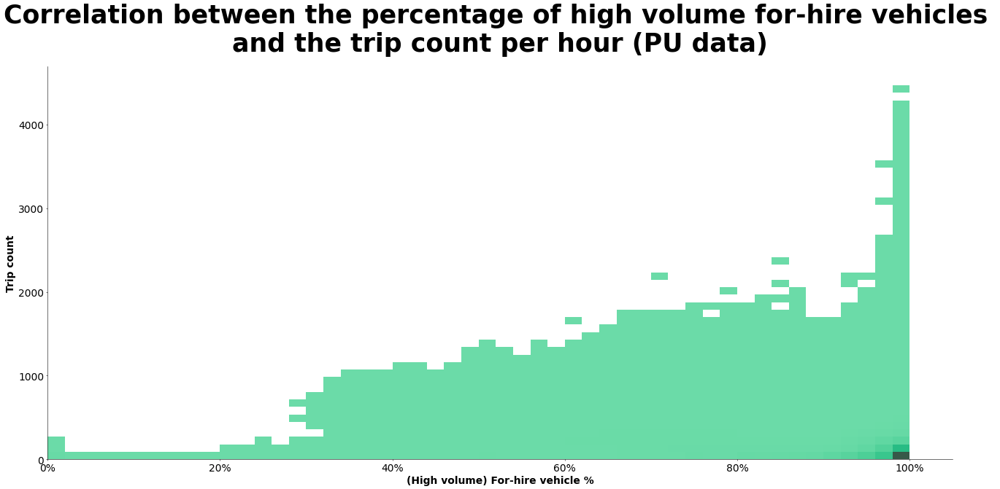

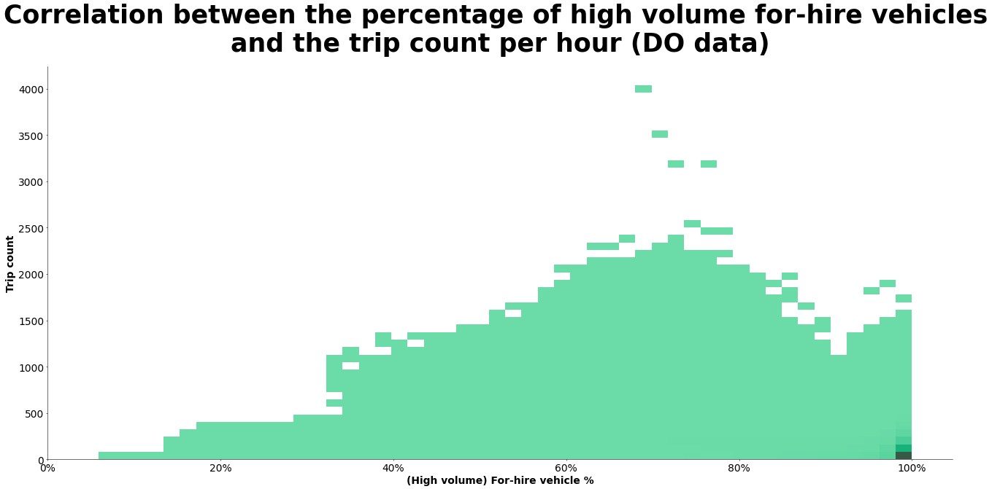

In [12]:
plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="fhvhv_percentage",
    y="trip_count",
    color="#19D694",
    bins=50
)

plt.title("Correlation between the percentage of high volume for-hire vehicles \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("(High volume) For-hire vehicle %", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.xticks(ticks=[0.0,0.2,0.4,0.6,0.8,1.0], labels=["0%","20%","40%","60%","80%","100%"])

plt.savefig("Plots\Correlations\TripCountVSfhvhv%\DOsVSfhvhv%Hist.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= PUs_df,
    x="fhvhv_percentage",
    y="trip_count",
    color="#19D694",
    bins=50
)

plt.title("Correlation between the percentage of high volume for-hire vehicles \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("(High volume) For-hire vehicle %", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.xticks(ticks=[0.0,0.2,0.4,0.6,0.8,1.0], labels=["0%","20%","40%","60%","80%","100%"])

plt.savefig("Plots\Correlations\TripCountVSfhvhv%\PUsVSfhvhv%Hist.png",dpi=300)
plt.show()

Trip distance against fare amount

474
413
30
246


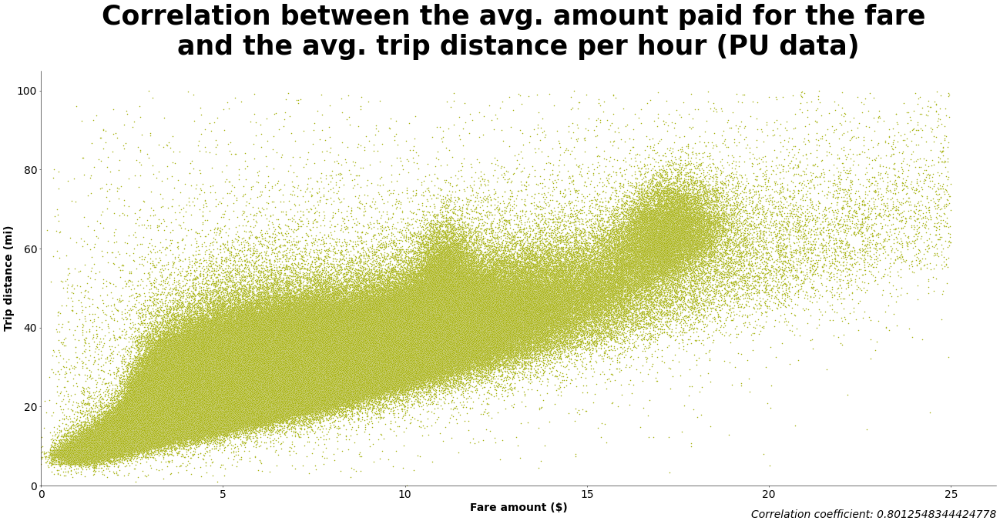

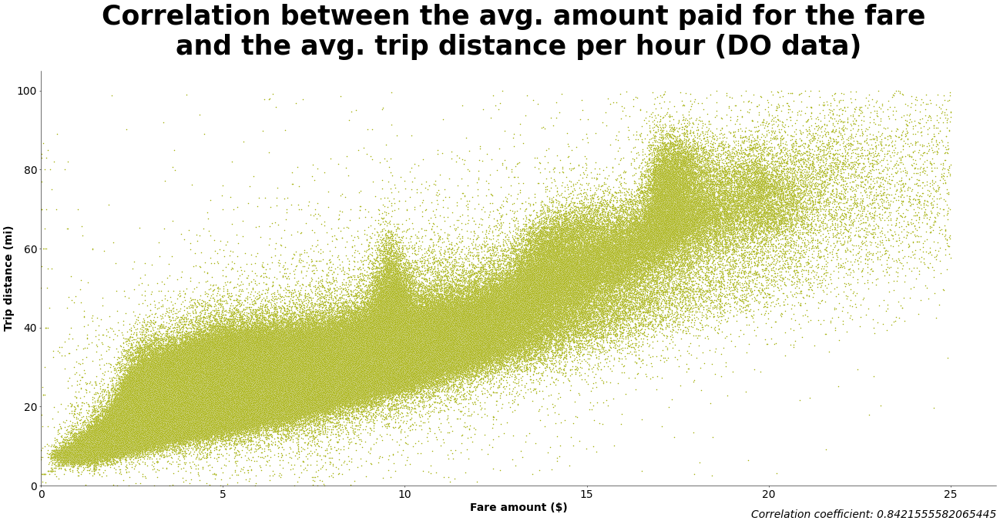

In [13]:
print((PUs_df["fare_amount"] > 100).sum())
print((DOs_df["fare_amount"] > 100).sum())
print((PUs_df["fare_amount"] < 0).sum())
print((DOs_df["fare_amount"] < 0).sum())

PUs_df = PUs_df[(PUs_df["fare_amount"] < 100)]
DOs_df = DOs_df[(DOs_df["fare_amount"] < 100)]
PUs_df = PUs_df[(PUs_df["fare_amount"] > 0)]
DOs_df = DOs_df[(DOs_df["fare_amount"] > 0)]


plt.figure(figsize=(32,14),)

sns.scatterplot(
    data=PUs_df,
    x="trip_distance",
    y="fare_amount",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount paid for the fare \nand the avg. trip distance per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip distance (mi)", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["fare_amount"].corr(PUs_df["trip_distance"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripDistanceVSFareAmount\PUsTripDistanceVSFareclean.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="trip_distance",
    y="fare_amount",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount paid for the fare \nand the avg. trip distance per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip distance (mi)", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["fare_amount"].corr(DOs_df["trip_distance"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripDistanceVSFareAmount\DOsTripDistanceVSFareclean.png",dpi=300)
plt.show()

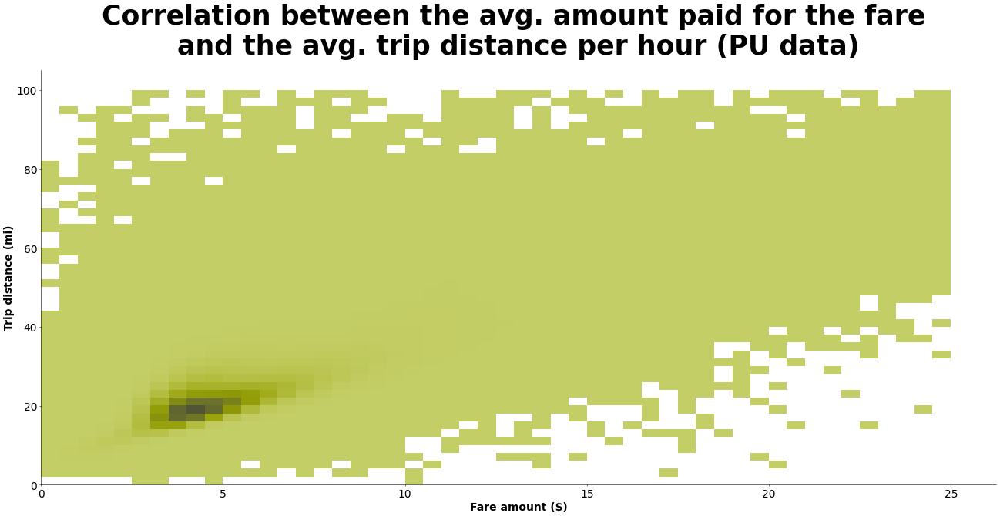

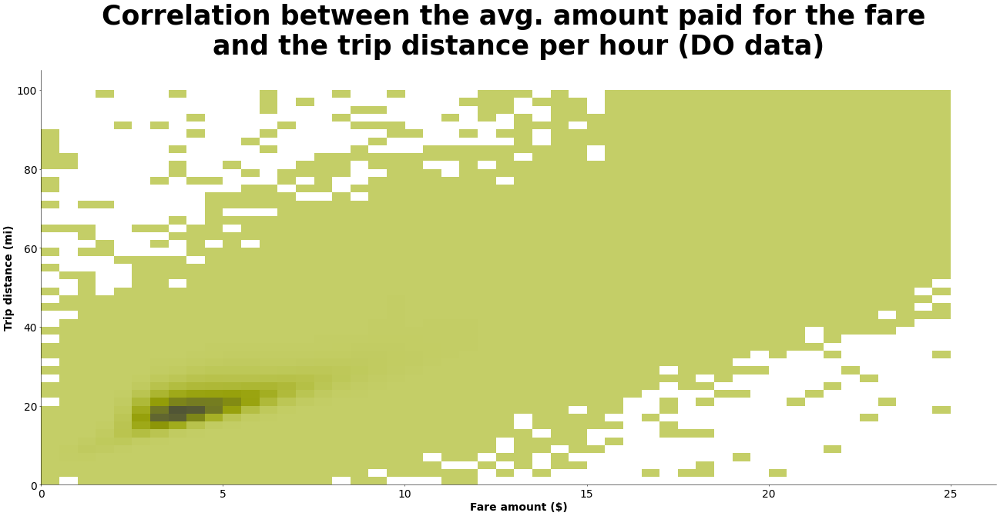

In [14]:
plt.figure(figsize=(32,14))

sns.histplot(
    data= PUs_df,
    x="trip_distance",
    y="fare_amount",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. amount paid for the fare \nand the avg. trip distance per hour (PU data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip distance (mi)", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripDistanceVSFareAmount\PUsTripDistanceVSFarehist.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="trip_distance",
    y="fare_amount",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. amount paid for the fare \nand the trip distance per hour (DO data)",
          fontsize=50, fontweight="bold",pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip distance (mi)", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripDistanceVSFareAmount\DOsTripDistanceVSFarehist.png",dpi=300)
plt.show()

Trip count vs. fare amount

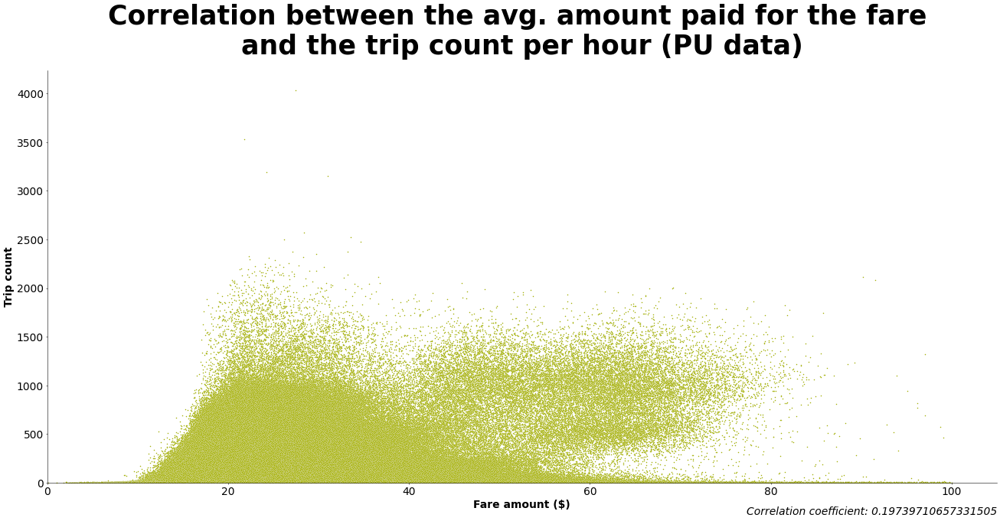

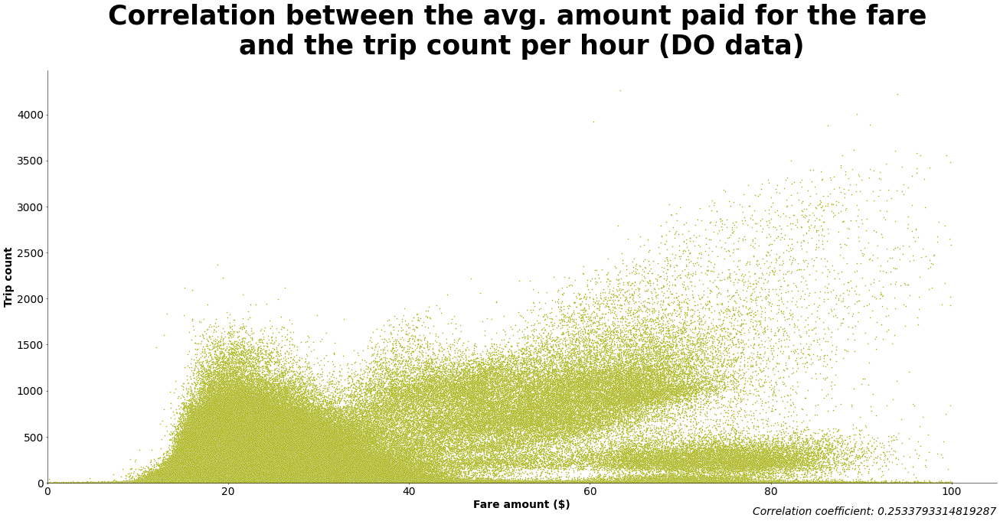

In [15]:
plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="fare_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount paid for the fare \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["fare_amount"].corr(PUs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\PUsTripCountVSFare.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="fare_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount paid for the fare \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["fare_amount"].corr(DOs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\DOsTripCountVSFare.png",dpi=300)
plt.show()

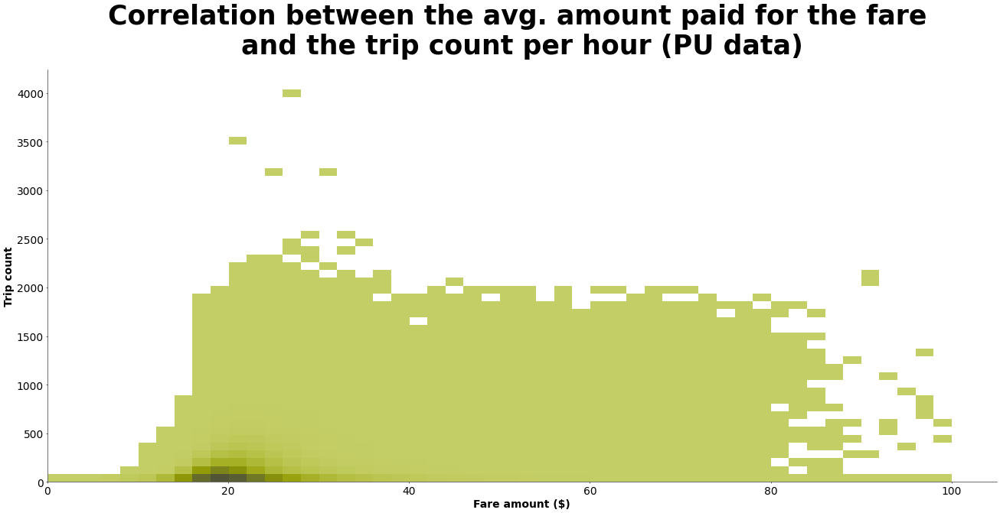

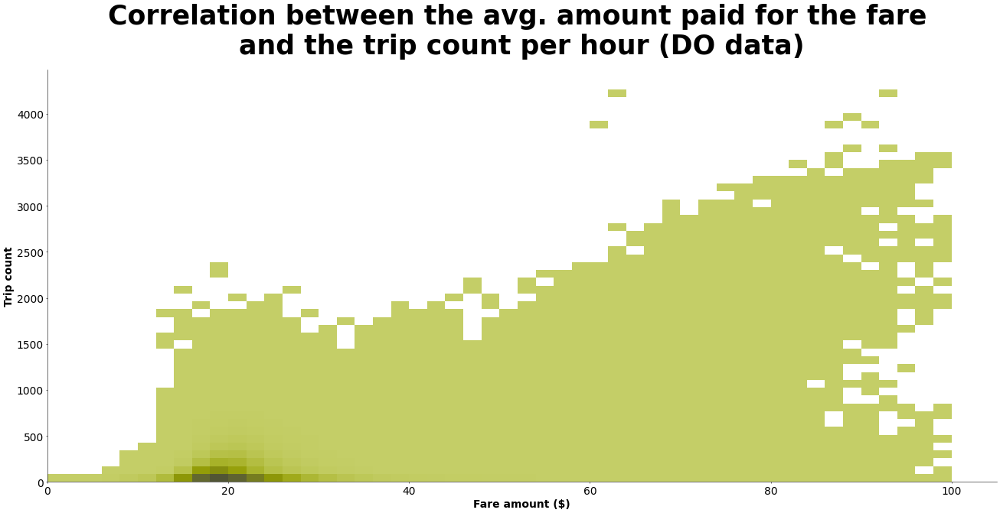

In [16]:
plt.figure(figsize=(32,14))

sns.histplot(
    data= PUs_df,
    x="fare_amount",
    y="trip_count",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. amount paid for the fare \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripCountVSAmounts\PUsTripCountVSFarehist.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="fare_amount",
    y="trip_count",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. amount paid for the fare \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Fare amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripCountVSAmounts\DOsTripCountVSFarehist.png",dpi=300)
plt.show()

Trip count vs. tip amount

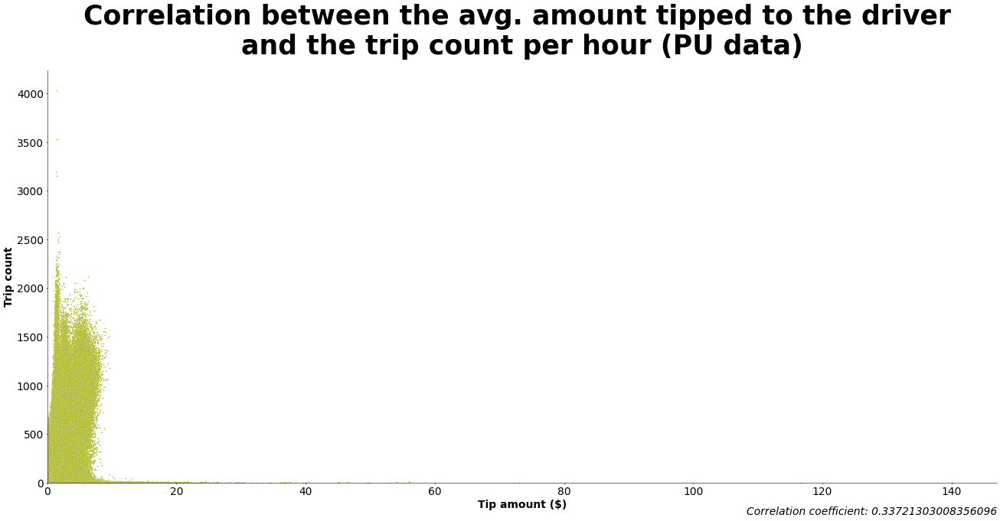

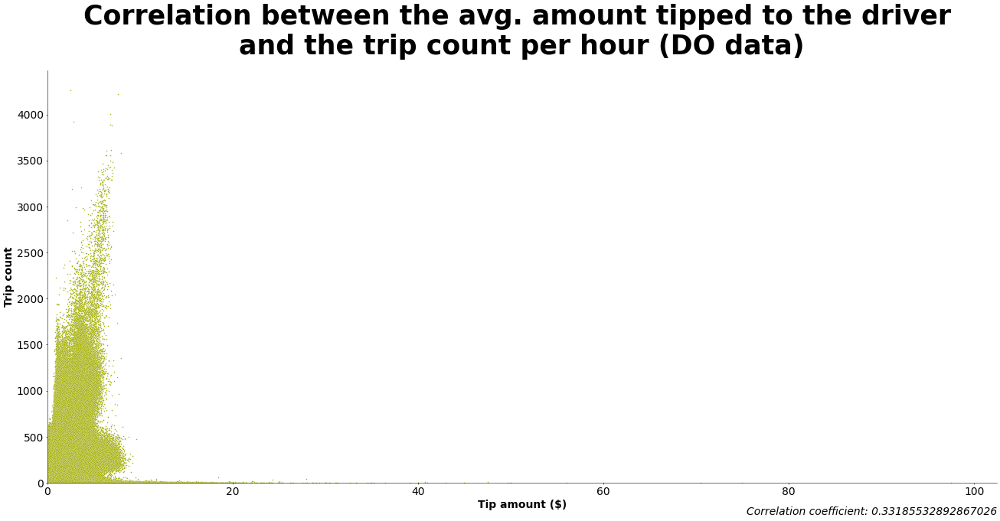

In [17]:
plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="tip_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount tipped to the driver \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Tip amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["tip_amount"].corr(PUs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\PUsTripCountVSTip.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="tip_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount tipped to the driver \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Tip amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["tip_amount"].corr(DOs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\DOsTripCountVSTip.png",dpi=300)
plt.show()

0
2
2908
2653


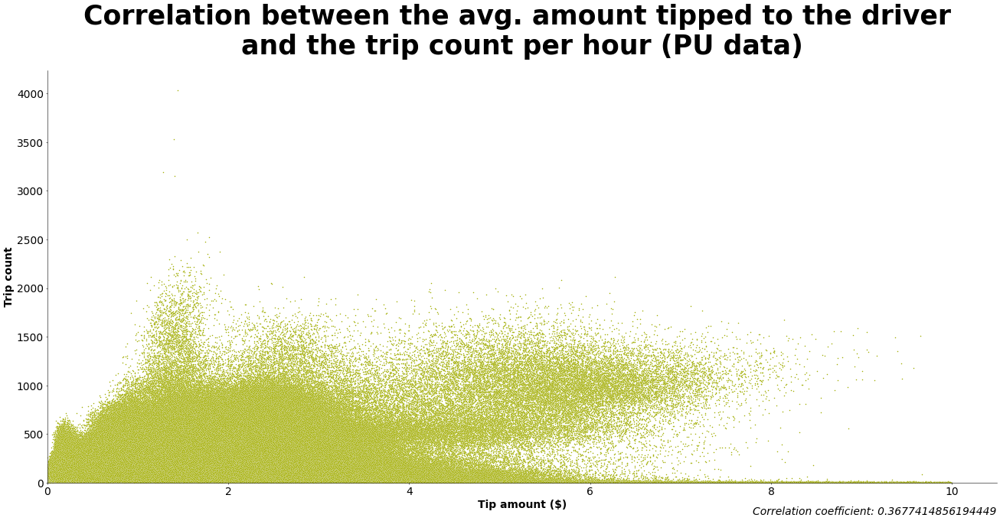

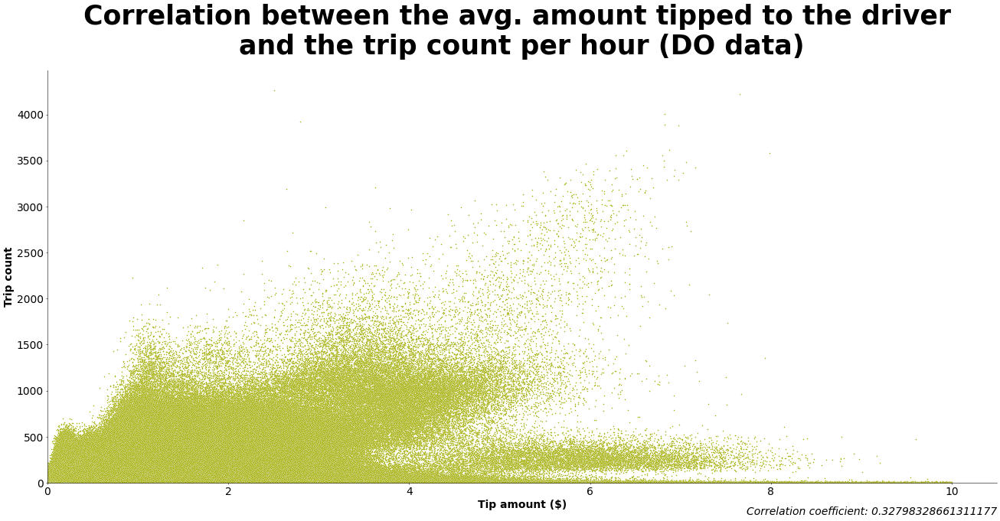

In [18]:

print((PUs_df["tip_amount"] < 0).sum())
print((DOs_df["tip_amount"] < 0).sum())
print((PUs_df["tip_amount"] > 10).sum())
print((DOs_df["tip_amount"] > 10).sum())

PUs_df = PUs_df[(PUs_df["tip_amount"] < 10)]
DOs_df = DOs_df[(DOs_df["tip_amount"] < 10) & (DOs_df["tip_amount"] > 0)]

plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="tip_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount tipped to the driver \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Tip amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["tip_amount"].corr(PUs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\PUsTripCountVSTipclean.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="tip_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. amount tipped to the driver \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Tip amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["tip_amount"].corr(DOs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\DOsTripCountVSTipclean.png",dpi=300)
plt.show()

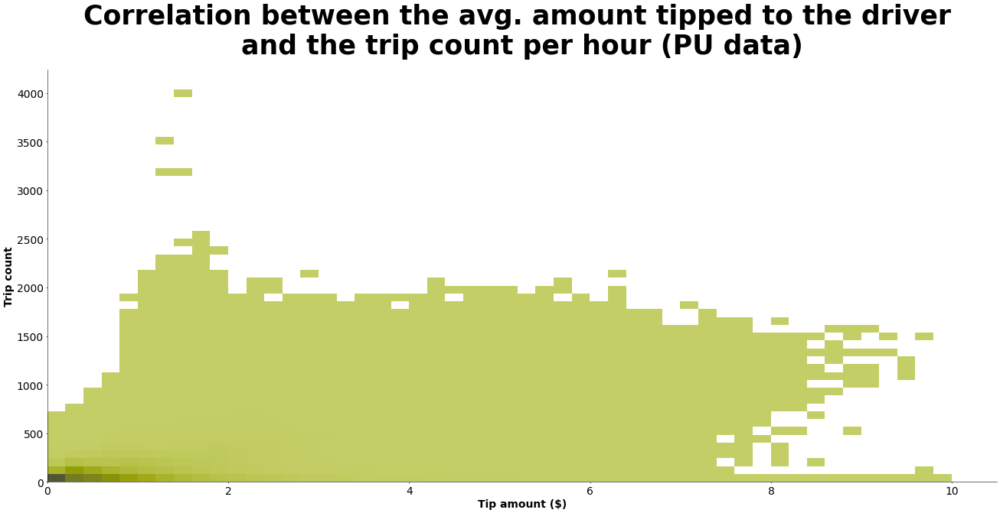

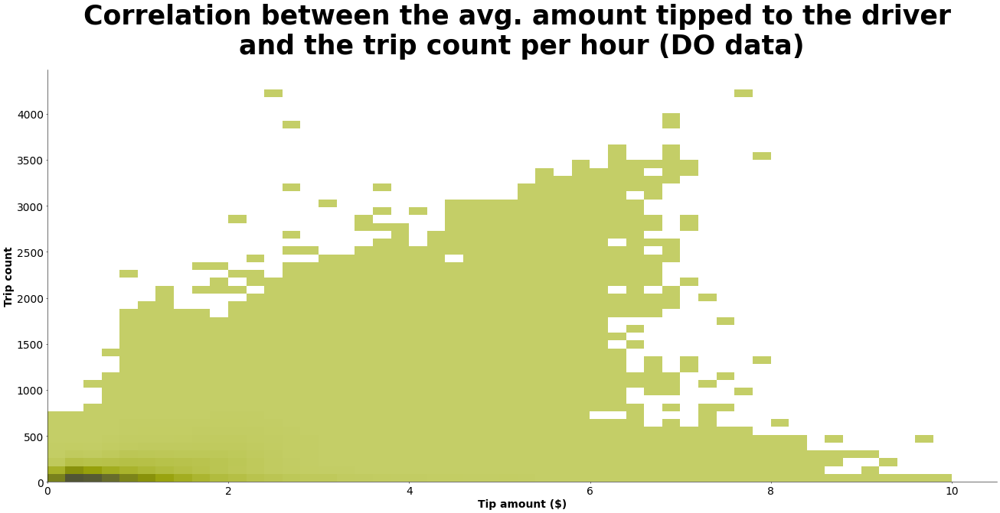

In [19]:
plt.figure(figsize=(32,14))

sns.histplot(
    data= PUs_df,
    x="tip_amount",
    y="trip_count",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. amount tipped to the driver \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Tip amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripCountVSAmounts\PUsTripCountVSTiphist.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="tip_amount",
    y="trip_count",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. amount tipped to the driver \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Tip amount ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripCountVSAmounts\DOsTripCountVSTiphist.png",dpi=300)
plt.show()

Trip count vs. total amount paid

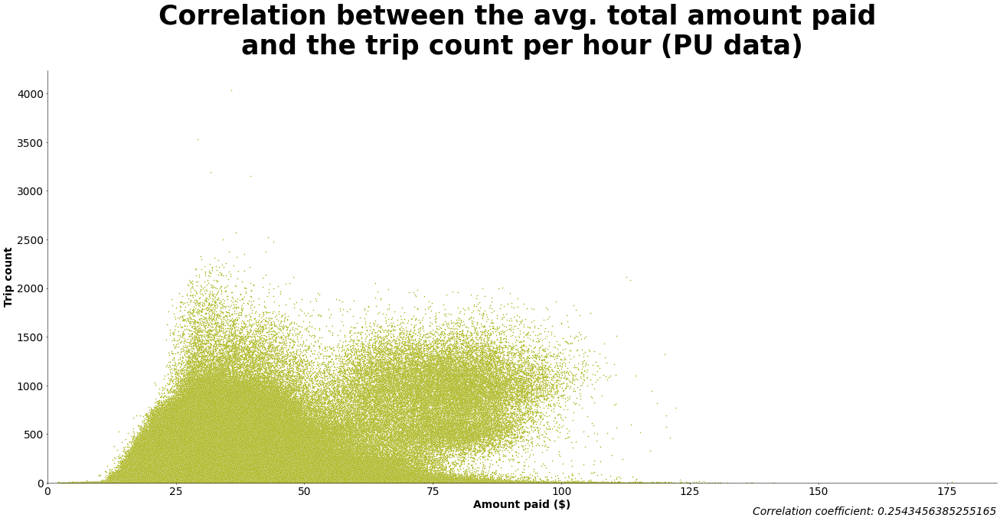

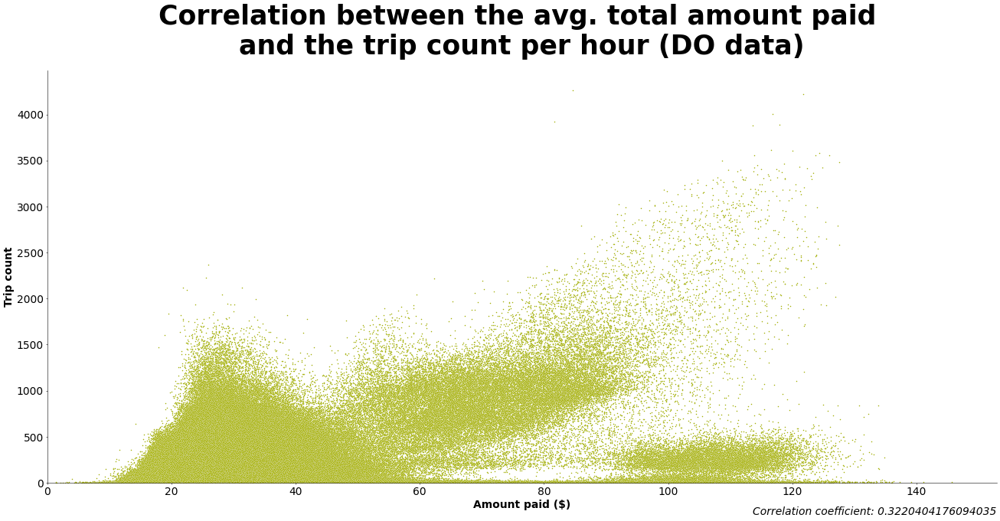

In [20]:
plt.figure(figsize=(32,14))

sns.scatterplot(
    data=PUs_df,
    x="total_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. total amount paid \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Amount paid ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = PUs_df["total_amount"].corr(PUs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\PUsTripCountVSTotal.png",dpi=300)
plt.show()

plt.figure(figsize=(32,14))

sns.scatterplot(
    data=DOs_df,
    x="total_amount",
    y="trip_count",
    color="#A6B10A",
    s=5
)

plt.title("Correlation between the avg. total amount paid \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Amount paid ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

corr_coeff = DOs_df["total_amount"].corr(DOs_df["trip_count"])
plt.figtext(0.9,0.05,f"Correlation coefficient: {corr_coeff}",ha="right",fontstyle="italic")

plt.savefig("Plots\Correlations\TripCountVSAmounts\DOsTripCountVSTotal.png",dpi=300)
plt.show()

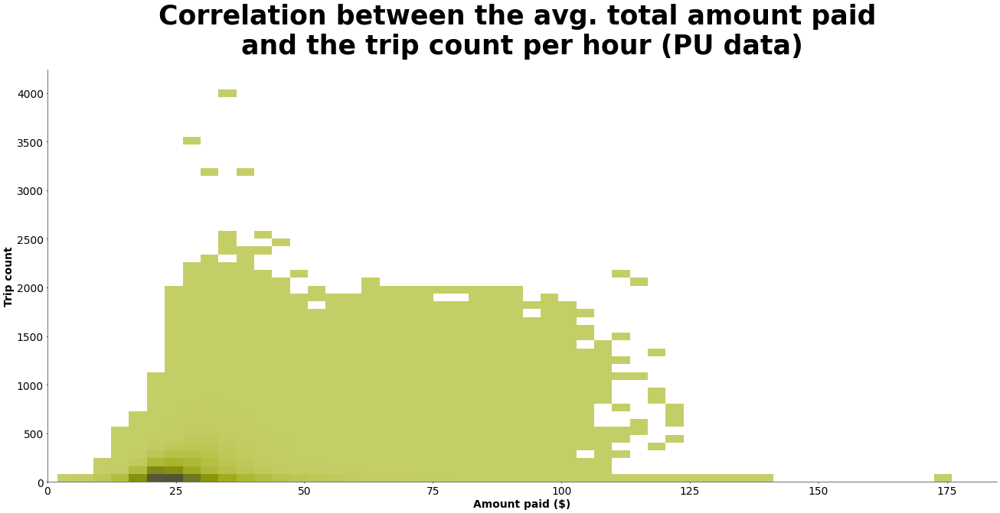

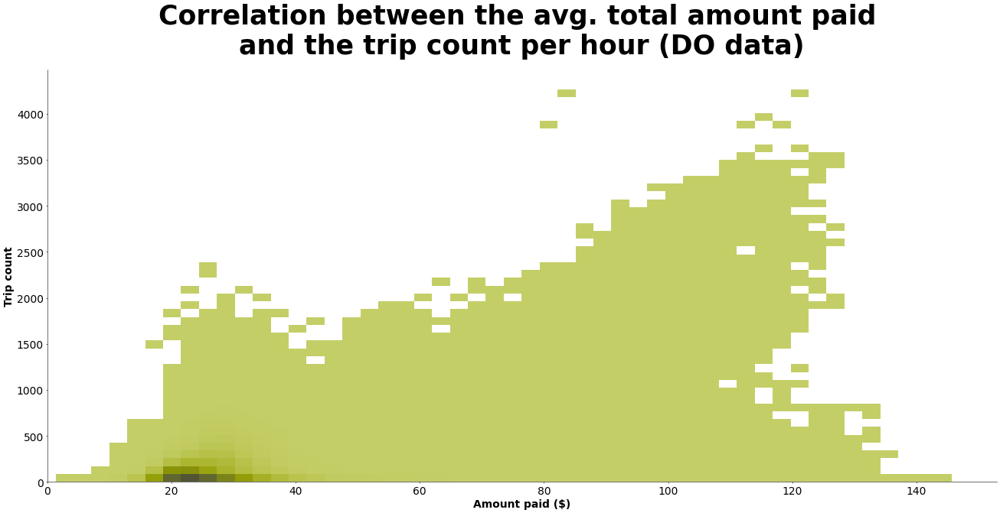

In [21]:
plt.figure(figsize=(32,14))

sns.histplot(
    data= PUs_df,
    x="total_amount",
    y="trip_count",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. total amount paid \nand the trip count per hour (PU data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Amount paid ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripCountVSAmounts\PUsTripCountVSTotalhist.png",dpi=300)
plt.show()


plt.figure(figsize=(32,14))

sns.histplot(
    data= DOs_df,
    x="total_amount",
    y="trip_count",
    color="#A6B10A",
    bins=50
)

plt.title("Correlation between the avg. total amount paid \nand the trip count per hour (DO data)",
          fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Amount paid ($)", fontweight="bold")
plt.ylabel("Trip count", fontweight="bold")
plt.xlim(left=0)
plt.ylim(bottom=0)

sns.despine()

plt.savefig("Plots\Correlations\TripCountVSAmounts\DOsTripCountVSTotalhist.png",dpi=300)
plt.show()